# Purpose of the notebook

In this notebook we cluster together the cells segmented by baysor (best performing algorithm) and the ones obtained by Xenium's 10x default segmentation (only nuclear reads). We aim to explore differences and similarities between them. For this we use a mouse brain coronal section, labelled as `msbrain_multisection_1`

### Import packages

In [1]:
import scanpy as sc
import numpy as np
import xb.plotting as xp
import matplotlib.pyplot as plt
from xb.preprocessing import *

## Read nuclei AnnData 
We read the Xenium-based segmentation output with only nuclear reads. Since baysor was performed on a subset of the tissue, we also need to subset the oiginal dataset to that region

In [2]:
# region of interest where segmentation analysis was done
y_interval=[17000,27000]
x_interval=[22000,42000]

In [3]:
nuclei_only=sc.read('/media/sergio/xenium_b_and_heart/Xenium_benchmarking-main/data/unprocessed_adata_nuclei/ms_brain_multisection1.h5ad')
nuclei_only.obs['x_centroid']=nuclei_only.obs['x_centroid']*4.70588
nuclei_only.obs['y_centroid']=nuclei_only.obs['y_centroid']*4.70588
nuclei_only=nuclei_only[(nuclei_only.obs['x_centroid']>x_interval[0]) & (nuclei_only.obs['x_centroid']<x_interval[1])]
nuclei_only=nuclei_only[(nuclei_only.obs['y_centroid']>y_interval[0]) & (nuclei_only.obs['y_centroid']<y_interval[1])]
nuclei_only.obs['segmentation']='nuclei'
nuclei_only.obs['sample']='nuclei'

/home/sergio/anaconda3/envs/xb_dev3/lib/python3.7/site-packages/ipykernel_launcher.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  


We just double-check what are we have subset

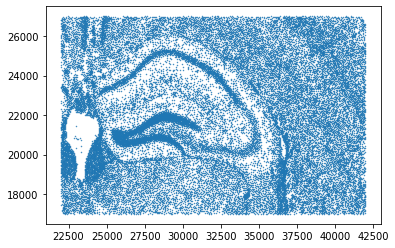

In [4]:
plt.scatter(nuclei_only.obs['x_centroid'],nuclei_only.obs['y_centroid'],s=0.2)

# Read Baysor's output and format it

In [5]:
baysor=sc.read('/media/sergio/xenium_b_and_heart/Xenium_benchmarking-main/data/resegmented_adata_baysor/counts_custom-0_baysor-82_area-0_majority-0.h5ad')

In [6]:
baysor.obs['x_centroid']=baysor.obs['centroid_x']
baysor.obs['y_centroid']=baysor.obs['centroid_y']
baysor.obs['segmentation']='baysor'
baysor.obs['sample']='baysor'

In [7]:
baysor.X=baysor.layers['raw']

We combine cells from both segmentations into a single AnnData object to preprocess

In [8]:
adata=sc.concat([nuclei_only,baysor])

/home/sergio/anaconda3/envs/xb_dev3/lib/python3.7/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Now we preprocess cells and cluster them

In [9]:
adata.obsm['spatial']=np.array(adata.obs.loc[:,['x_centroid','y_centroid']])
adata.obs['total_counts']=list(np.sum(adata.X,axis=1).transpose().tolist()[0])
adata.obs['expressed_genes']=list(np.sum(adata.X>0,axis=1).transpose().tolist()[0])

In [10]:
# Formatting filesand preprocessing
output_path='/media/sergio/xenium_b_and_heart/Xenium_benchmarking-main/data/resegmented_adata_baysor/'
clustering_params={'normalization_target_sum':100,
'min_counts_x_cell':40, 'min_genes_x_cell':15,'scale':False, 'clustering_alg':'louvain',
'resolutions':[1.0], 'n_neighbors':15,'umap_min_dist':0.1,
'n_pcs':0} # this are the clustering parameters

/home/sergio/anaconda3/envs/xb_dev3/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/home/sergio/anaconda3/envs/xb_dev3/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/home/sergio/anaconda3/envs/xb_dev3/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:399: Perfo

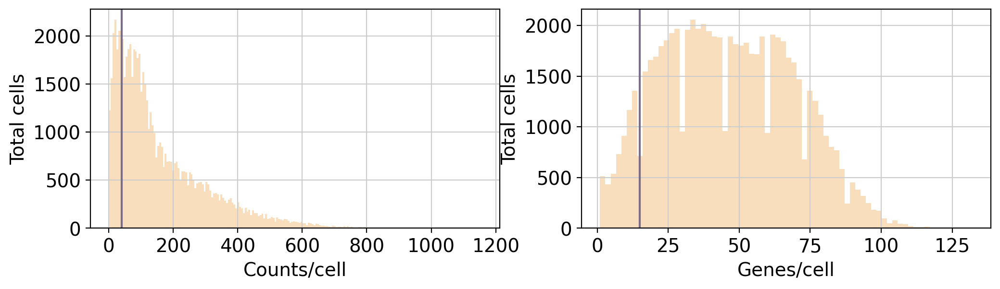

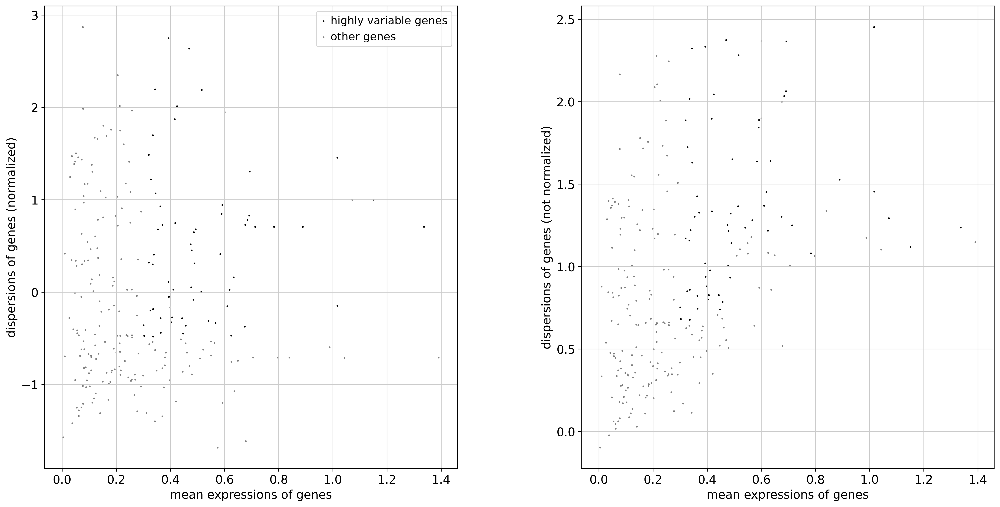

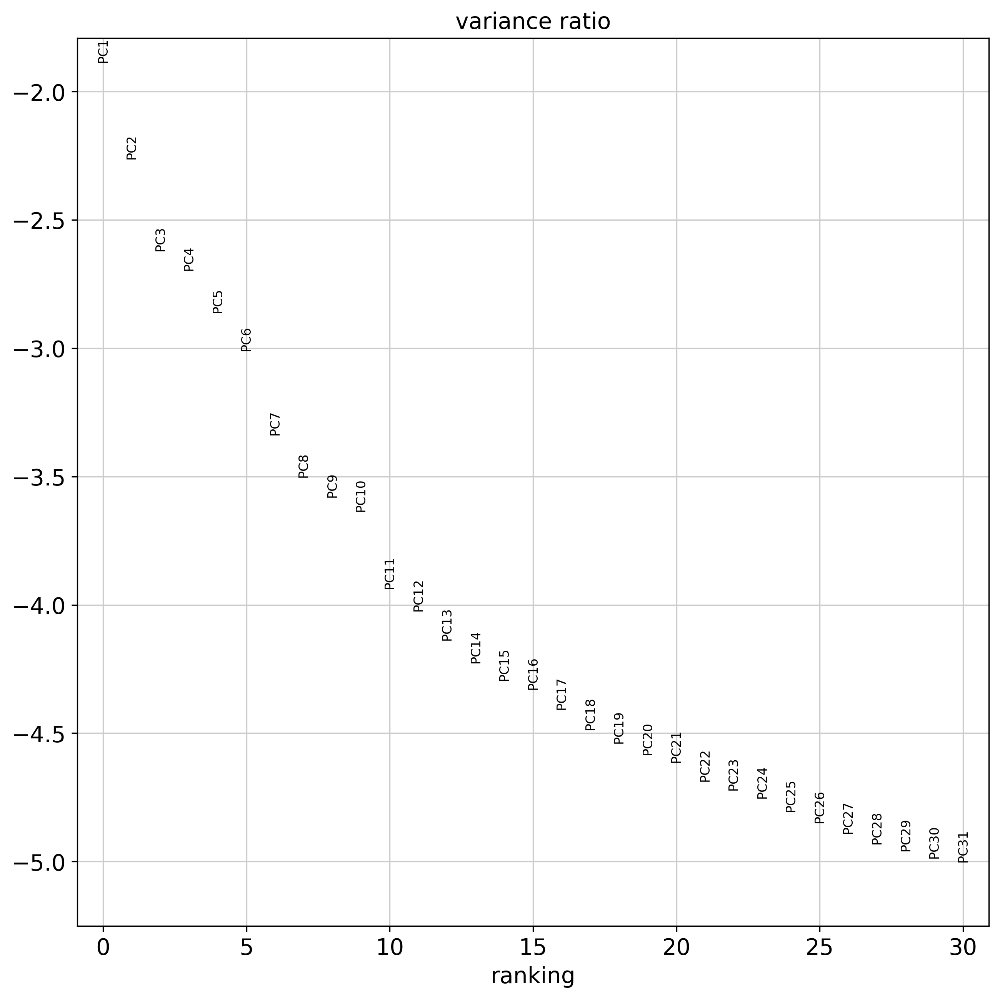

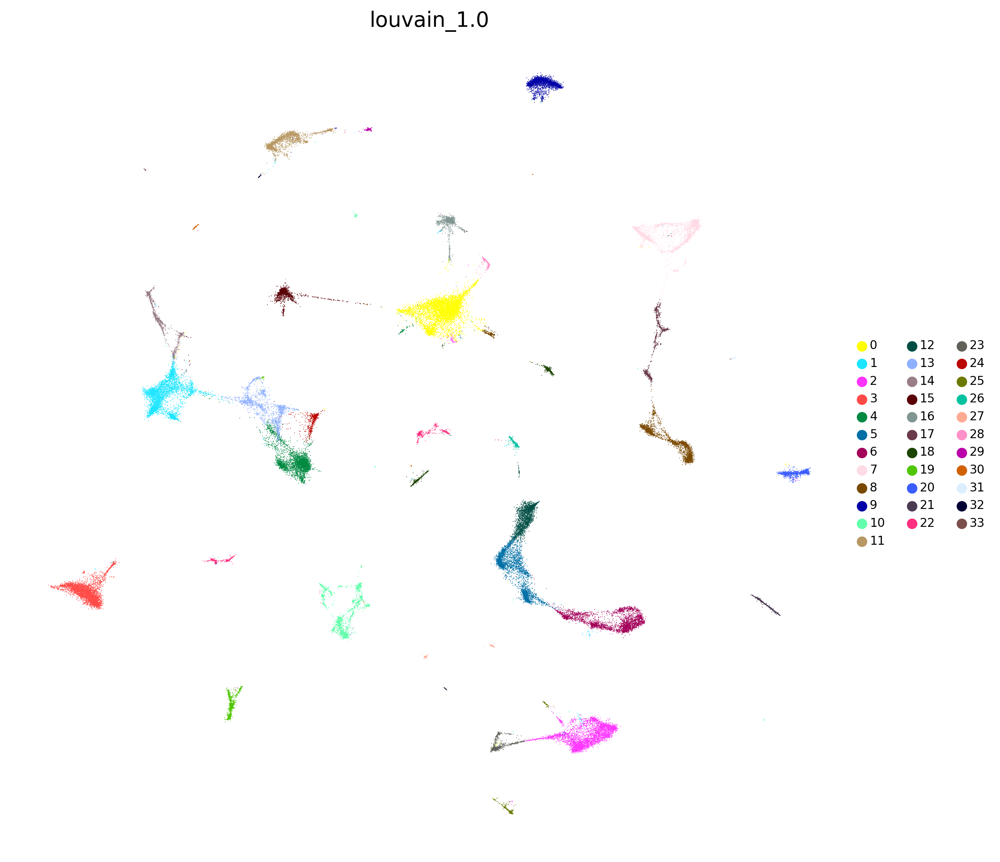

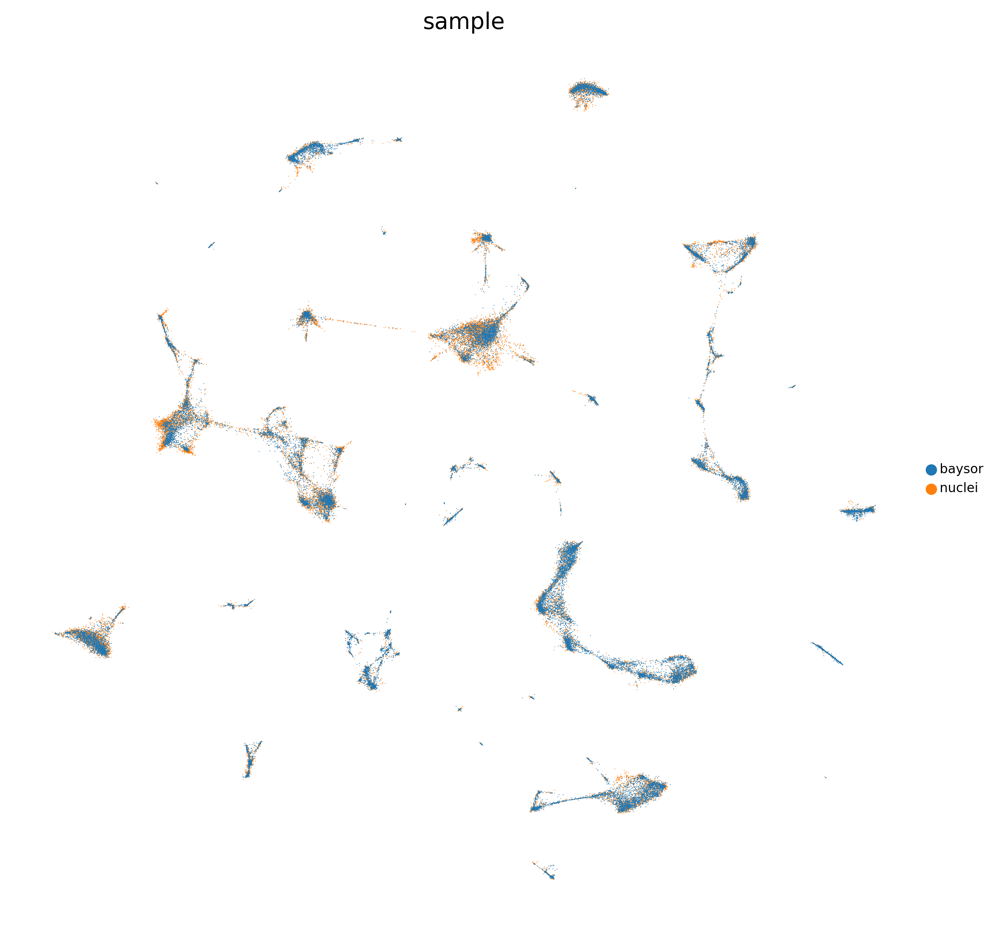

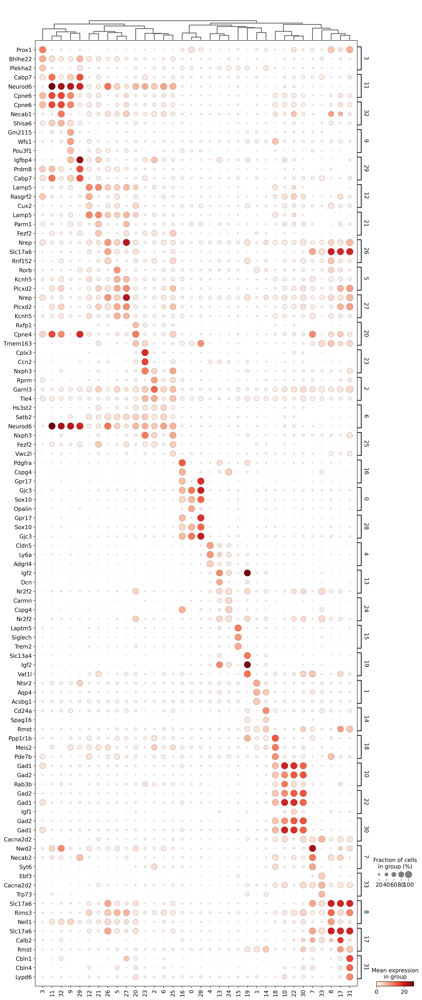

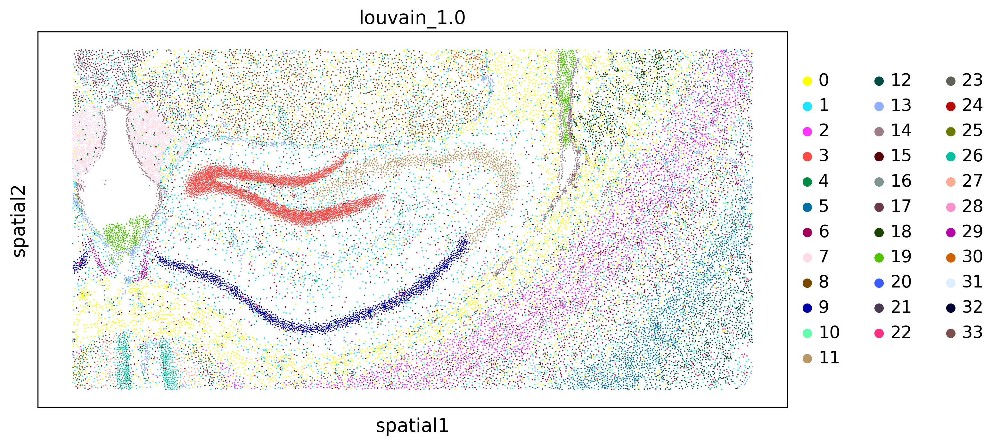

<Figure size 1500x1500 with 0 Axes>

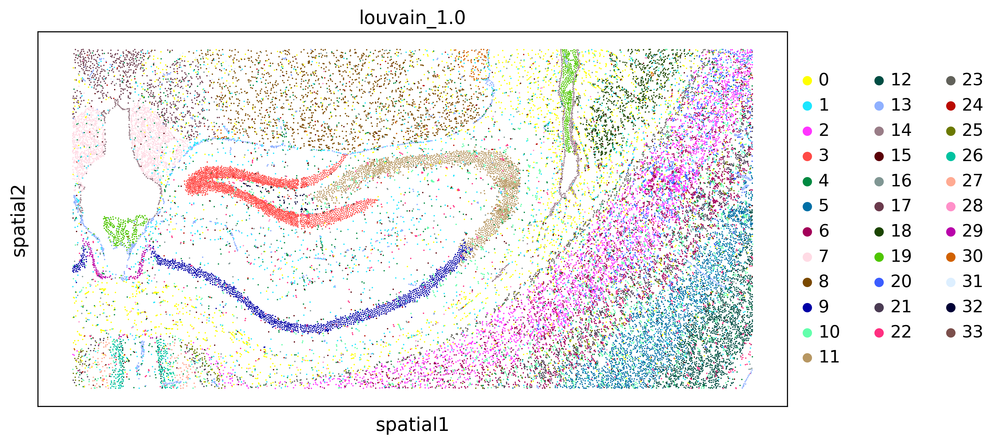

<Figure size 1500x1500 with 0 Axes>

In [11]:
adata_processed=preprocess_adata(adata,save=True,clustering_params=clustering_params,output_path=output_path)

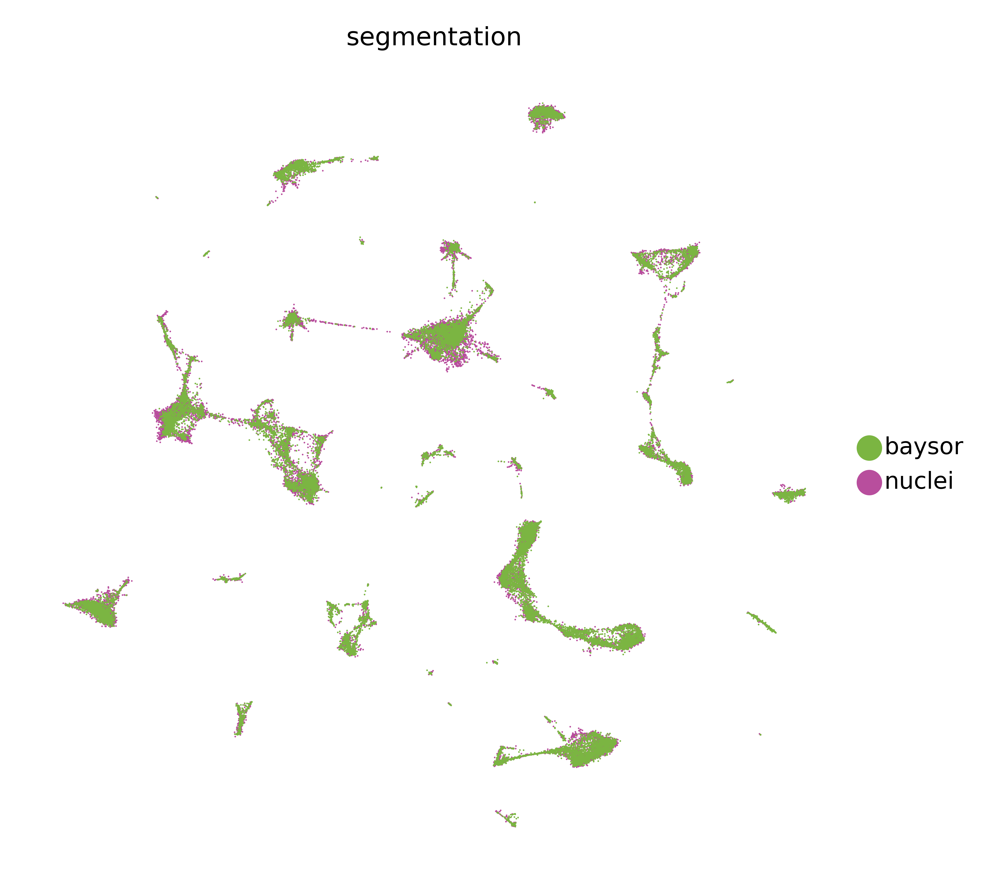

In [19]:
sc.set_figure_params(scanpy=True, dpi=500, dpi_save=500, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sc.pl.umap(adata_processed,color='segmentation',show=False,s=0.8,sort_order=False,palette=['#7BB542','#B84E9D'])
plt.savefig(output_path+'/UMAP_between_segmentations.pdf')

# We import the already annotated object
We would like to use the already annotated cells from Figure 1 in the manuscript (Notebook 1_2) so that we can transfer the annotations to this dataset easily

In [255]:
adata_ref=sc.read('/media/sergio/xenium_b_and_heart/Xenium_benchmarking-main/data/processed_adata/adata_multisection_nuclei_3rep_withHM_withclusters.h5ad')

/home/sergio/anaconda3/envs/xb_dev3/lib/python3.7/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [256]:
adata_ref_ms1=adata_ref[adata_ref.obs['replicate']=='1']

In [257]:
id2class=dict(zip(adata_ref_ms1.obs['cell_id'],adata_ref_ms1.obs['Class']))
adata_processed.obs.loc[adata_processed.obs['segmentation']=='baysor','cell_id']='nan'
adata_processed.obs['Class']=adata_processed.obs['cell_id'].map(id2class)
correspondance=pd.DataFrame(pd.crosstab(adata_processed.obs['louvain_1.0'],adata_processed.obs['Class']).idxmax(axis=1))
cluster2Class=dict(zip(correspondance.index,correspondance.iloc[:,0]))
adata_processed.obs['Class']=adata_processed.obs['louvain_1.0'].map(cluster2Class)

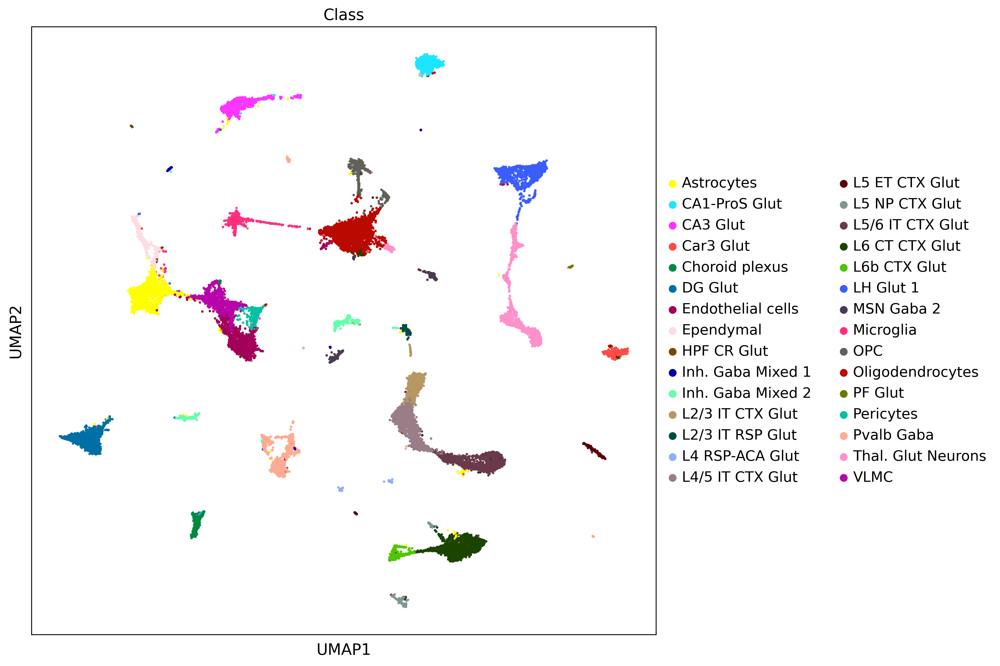

In [258]:
sc.pl.umap(adata_processed,color='Class',s=20)

# Plotting
Once we have annotated the datasets, we generate plots comparing cell type frequencies, counts/ cell and spatial maps

In [259]:
import xb.plotting as xp

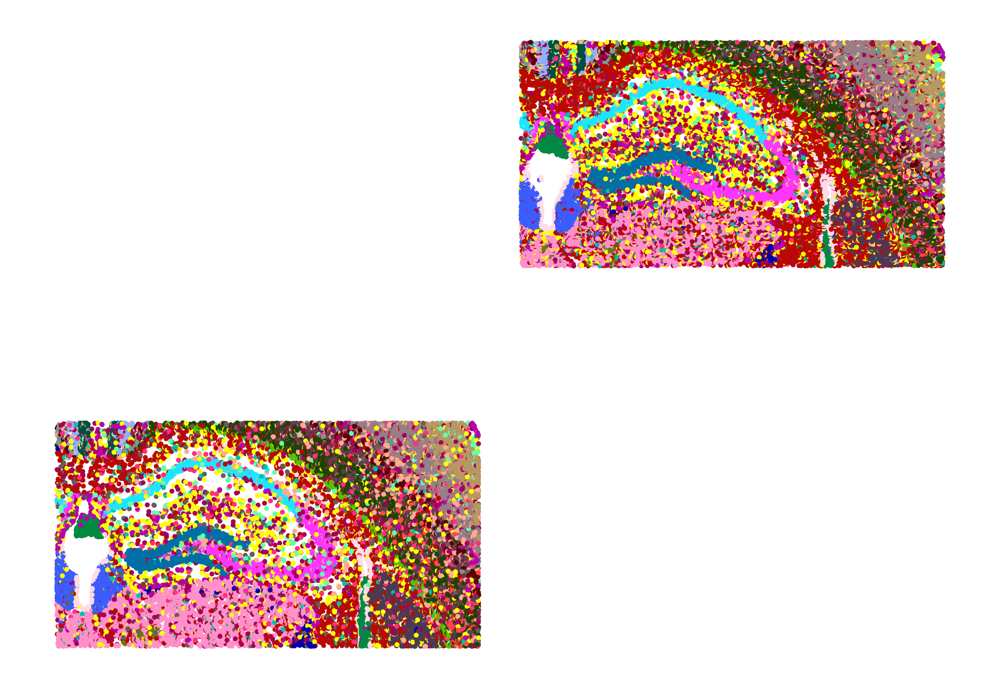

In [262]:
adata_processed.obs['X']=adata_processed.obs['x_centroid']
adata_processed.obs['Y']=adata_processed.obs['y_centroid']
xp.map_of_clusters(adata_processed,key='Class')

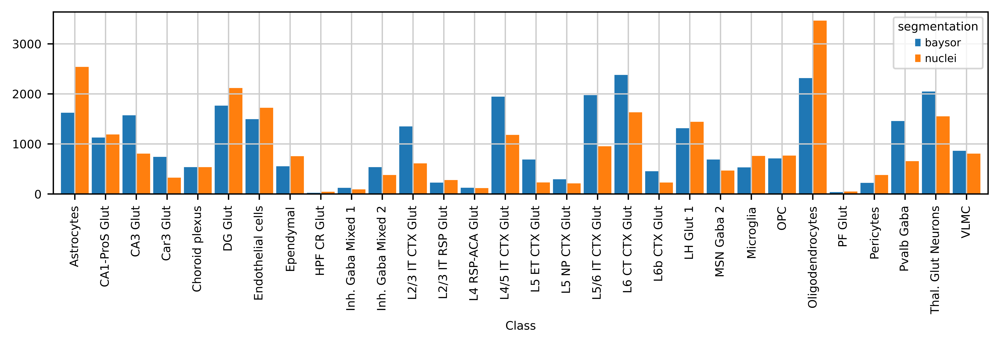

In [273]:
sc.set_figure_params(scanpy=True, dpi=700, dpi_save=700, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
freqs=pd.crosstab(adata.obs['Class'],adata.obs['segmentation'])
freqs.plot(kind='bar',width=0.9,figsize=(10,2))
plt.savefig(output_path+'/frequencies_between_segmentations.pdf')

/home/sergio/anaconda3/envs/xb_dev3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


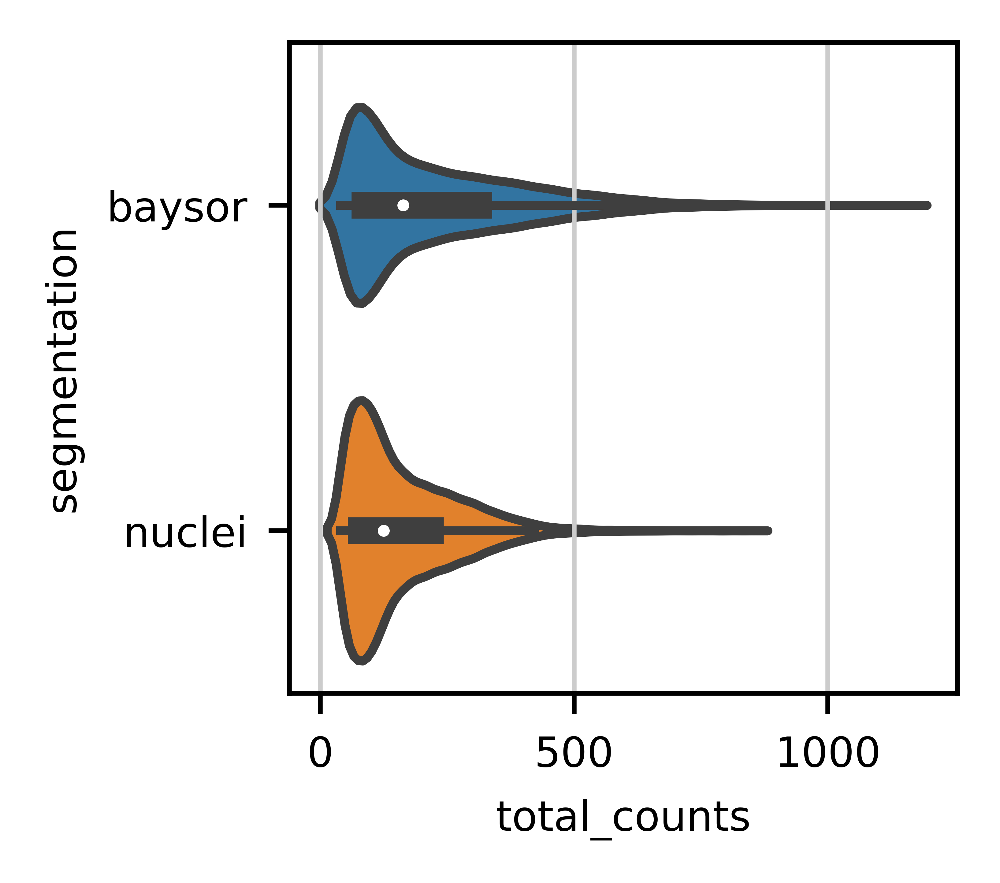

In [277]:
sc.set_figure_params(scanpy=True, dpi=700, dpi_save=700, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.figure(figsize=(2,2))
sns.violinplot(adata.obs['total_counts'],y=adata.obs['segmentation'],figuresize=(2,2))
plt.savefig(output_path+'/counts_between_segmentations.pdf')